###
#### Simulation Steps
- present all the **waterway stretches** on the graph with navigation conditions. The graph is composed of nodes connected by edges. The navigation conditions are assigned to the edges as 'edge info'.
- define the sailing **path** by specifying the start node and end node. Here we define 8 paths for the 8 stretches to analyse the vessel sailing energy efficiency at each stretch. 
- create the **vessel** with specified dimensions, installed ME power, default sailing speed, sailing direction, ukc safety margin, enable the has_squat function.
- calculate **feasible speed range**: use get_v funtion from OpenTNSim-Energy's 'strategy module' to get maximum feasible velocity considering both installed enegine power and ship squat while moving at a speed for different water depths
- **assign** each of the 8 **paths** to the vessel,
- run the **energy simulation** with feasible speed range input table for each path, output a table with simulation results of all the indicators
- integrate the simulation results table of each path to get an **united table** for the whole route
- use 'Parallel coordinate **plot**' to visualise the united table covering all the possibilities
- show an **example** with transport time constraints and the energy goal


 -----------------
 ##

In [1]:

# spatial libraries
import shapely.geometry
import pyproj

# package(s) for data handling
import numpy as np
import matplotlib.pyplot as plt
import requests
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go

import functools
import itertools
import warnings
warnings.filterwarnings('ignore')
import sys
sys.tracebacklimit=0
# package(s) related to time, space and id
import logging
import datetime, time
import platform

# package(s) related to the simulation
import simpy
import pandas as pd

# spatial libraries 
import pyproj
import shapely.geometry
from simplekml import Kml, Style

# package(s) for data handling

import scipy.optimize
import matplotlib.pyplot as plt
from matplotlib.ticker import StrMethodFormatter
import tqdm

# Used for mathematical functions
import math             

import plotly.express as px
from plotly.subplots import make_subplots

#logging.basicConfig(level=logging.DEBUG) #turn on all the debug messages
#logging.basicConfig(level=logging.INFO)# turn off all the debug messages

logger = logging.getLogger('notebook')

# Used for making the graph
import networkx as nx

# OpenTNSim
import opentnsim


### create graph with waterway and navigation info

In [2]:
# specify a number of coordinate along your route (coords are: lon, lat)
coords = [
    [0,0],
    [0.4492,0],
    [1.1678,0], 
    [1.6619,0]  
] 

# for each edge (between above coordinates) specify the depth (m)
depths = [6, 4.5, 3.5]

current_speeds = [-0.75,
                  -1.25,
                  -1.5]  # [m/s]


V_g_profile_up = [1,1,1] # this is not used as it has been set 'none' in vessel data dictionary below

V_g_profile_down = [1,1,1] # [m/s] for downstream

# check of nr of coords and nr of depths align
assert len(coords) == len(depths) + 1, 'nr of depths does not correspond to nr of coords'

In [3]:
# create a graph based on coords and depths
FG = nx.DiGraph()
nodes = []
path = []

# add nodes
Node = type('Site', (opentnsim.core.Identifiable, opentnsim.core.Locatable), {})

for index, coord in enumerate(coords):
    data_node = {"name": "Node " + str(index), "geometry": shapely.geometry.Point(coord[0], coord[1])}
    nodes.append(Node(**data_node))
    
positions = {}
for node in nodes:
    positions[node.name] = (node.geometry.x, node.geometry.y)
    FG.add_node(node.name, geometry = node.geometry)

# add edges
path = [[nodes[i], nodes[i+1]] for i in range(len(nodes)-1)]

for index, edge in enumerate(path):
    # For the energy consumption calculation we add info to the graph. We need depth info for resistance.
    # NB: the CalculateEnergy routine expects the graph to have "Info" that contains "GeneralDepth" 
    #     this may not be very generic!
    FG.add_edge(edge[0].name, edge[1].name, weight = 1, Info = {
        "GeneralDepth": depths[index],
        "CurrentSpeed": current_speeds[index],
        "VesselSpeedToGroundProfile_upstream": V_g_profile_up[index],
        "VesselSpeedToGroundProfile_downstream": V_g_profile_down[index]
    })

# toggle to undirected and back to directed to make sure all edges are two way traffic
FG = FG.to_undirected() 
FG = FG.to_directed() 

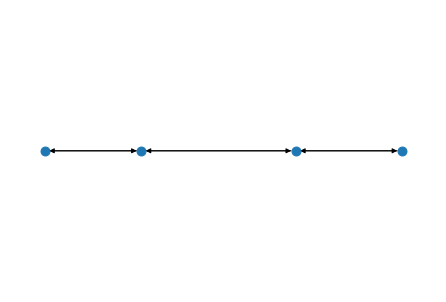

In [4]:
# show graph
nx.draw(FG, positions, node_size=80)

plt.show()

### create path

In [5]:
path_down_1 = nx.dijkstra_path(FG, nodes[1].name, nodes[0].name)
path_down_2 = nx.dijkstra_path(FG, nodes[2].name, nodes[1].name)
path_down_3 = nx.dijkstra_path(FG, nodes[3].name, nodes[2].name)


### create vessel

In [6]:
# Make your preferred class out of available mix-ins.
TransportResource = type(
    "Vessel",
    (
        opentnsim.core.Identifiable,
        opentnsim.core.Movable,
        opentnsim.core.Routeable,
        opentnsim.core.VesselProperties,  # needed to add vessel properties
        opentnsim.energy.ConsumesEnergy,
        opentnsim.core.ExtraMetadata,
    ),
    {},
)  # needed to calculate resistances

In [7]:
# Create a dict with all important settings

data_vessel = {
    "env": None,
    "name": 'M1_down',
    "route": None,
    "geometry": None,
    "v": None,  # m/s
    "V_g_ave":3.53,
    "use_V_g_profile":False,
    "type": None,
    "B": 5.1,
    "L": 38.5,
    "T": 1.2,
    "safety_margin": 0.3, # for tanker vessel with rocky bed the safety margin is recommended as 0.3 m
    "h_squat": False, # if consider the ship squatting while moving, set to True, otherwise set to False. Note that here we have disabled h_squat calculation since we regard the water depth h_0 is already reduced by squat effect. This applies to figures 3, 5, 7, 8 and 9.
    "payload":None,
    "vessel_type":"Dry_DH", #vessel types: "Container","Dry_SH","Dry_DH","Barge","Tanker". ("Dry_SH" means dry bulk single hull, "Dry_DH" means dry bulk double hull)    
    "P_installed":175,   
    "P_tot_given": None, # kW
    "bulbous_bow": False, # if a vessel has no bulbous_bow, set to False; otherwise set to True.
    "sailing_on_power": False,
    "sailing_upstream":False,
    "wind_influence": False,
    "P_hotel_perc": 0.08,
    "P_hotel": None, # None: calculate P_hotel from percentage
    "x": 1,# number of propellers
    "L_w": 1.0 ,
    "C_B":0.85, 
    "C_year": 2000, # the engine construction year is only used for diesel use and emissions quantification
}             



### prepare input for getting feasible velocities for all water depths

In [8]:


# create lists of strategy values
# T_actual = [2.5]
h = [6, 4.5, 3.5]
safety_margin = [0.3]
width = [200]


In [9]:
# prepare the work to be done by creating a list of all combinations
work = list(itertools.product( h,safety_margin, width))

# prepare a list of dictionaries for pandas
rows = []
for item in work:
    row = {"h": item[0], "safety_margin":item[1], "width":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progress
work_df = pd.DataFrame(rows)
work_df['stretch']= [1,2,3]
work_df['path']= [path_down_1,path_down_2,path_down_3]
work_df['current'] = [-0.75,
                  -1.25,
                  -1.5 ]# m/s
work_df.head(20)

,h,safety_margin,width,stretch,path,current
0,6.0,0.3,200,1,"[Node 1, Node 0]",-0.75
1,4.5,0.3,200,2,"[Node 2, Node 1]",-1.25
2,3.5,0.3,200,3,"[Node 3, Node 2]",-1.50


In [10]:
feasibilities = []

for i, row in tqdm.tqdm(work_df.iterrows(),disable=True):

    # get vessel 
    data_vessel_i = data_vessel.copy()
    vessel = TransportResource(**data_vessel_i)
    # vessel._T = row['T_actual']
    vessel.safety_margin = row['safety_margin']
    vessel.path = row['path']
    
    # estimate 'grounding speed' as a useful upperbound
    upperbound, selected, results_df = opentnsim.strategy.get_upperbound_for_power2v(vessel, width=row['width'], depth=row['h'], margin=0)
    
    # calculate the velocity that belongs to the h (while leaving the margin)
    v, depth, depth_squat, z_computed, margin = opentnsim.strategy.get_v(vessel, width=row['width'], depth=row['h'], margin=row['safety_margin'], bounds=(0, upperbound))
    

    
    feasibility ={}
    feasibility.update(row)
    feasibility['vg_feasible (m/s)'] = v #
    feasibility['vg_feasible (km/h)'] = v  * 3.6  # final max v considering squat and installed power  
    feasibility['z_computed (m)'] = z_computed     # maxiumum sinkage
    
    feasibilities.append(feasibility)

In [11]:
feasibilities_df = pd.DataFrame(feasibilities)
with pd.option_context('display.float_format', '{:.2f}'.format):
    display(feasibilities_df)

,h,safety_margin,width,stretch,path,current,vg_feasible (m/s),vg_feasible (km/h),z_computed (m)
0,6.00,0.30,200,1,"[Node 1, Node 0]",-0.75,4.45,16.03,0.05
1,4.50,0.30,200,2,"[Node 2, Node 1]",-1.25,4.25,15.30,0.06
2,3.50,0.30,200,3,"[Node 3, Node 2]",-1.50,4.05,14.57,0.07


### display all the feasible velocities for h

In [12]:

v_feasible_for_h = []
for row in feasibilities:
    max_velocity = row['vg_feasible (km/h)']
    min_velocity = 7.5
    stepsize = -0.3
    # create lists of strategy values
    v_feasible = np.arange(max_velocity, round(min_velocity + stepsize, 10), stepsize).round(2).tolist()
    v_feasible_for_h.append(v_feasible)
v_df = pd.DataFrame(v_feasible_for_h).T
names=['h=6','h=4.5','h=3.5']
v_df.columns=names
v_df

,h=6,h=4.5,h=3.5
0,16.03,15.3,14.57
1,15.73,15.0,14.27
2,15.43,14.7,13.97
3,15.13,14.4,13.67
4,14.83,14.1,13.37
5,14.53,13.8,13.07
6,14.23,13.5,12.77
7,13.93,13.2,12.47
8,13.63,12.9,12.17
9,13.33,12.6,11.87


### prepare input data for simulation

In [13]:
# create a new table of all the v/strategy combinations
# using the itertools.product is more pro
# but for now we'll just loop
rows = []
for feasibility in feasibilities:
    max_velocity = feasibility['vg_feasible (km/h)']
    min_velocity = 7.5
    stepsize = -0.3
    v_feasible = np.arange(max_velocity, round(min_velocity + stepsize, 2), stepsize).round(2)

    
    for v_feasible_i in v_feasible:
        row = {}
        row.update(feasibility)
        row['max_velocity'] = max_velocity
        row['min_velocity'] = min_velocity
        row['stepsize'] = stepsize
        row['v_feasible'] = v_feasible_i
       
        rows.append(row)
v_flat_df = pd.DataFrame(rows)        

    

In [14]:
v_flat_df['vg_feasible_km_h'] = v_flat_df['v_feasible']
v_flat_df['vg_feasible_m_s'] = v_flat_df['v_feasible'] /3.6
columns = ['stretch','path','h','width','vg_feasible_km_h','vg_feasible_m_s']
# select relevant info
# these are all the runs that we want to run a simulation 
runs_df = v_flat_df[columns]
runs_df

,stretch,path,h,width,vg_feasible_km_h,vg_feasible_m_s
0,1,"[Node 1, Node 0]",6.0,200,16.03,4.452778
1,1,"[Node 1, Node 0]",6.0,200,15.73,4.369444
2,1,"[Node 1, Node 0]",6.0,200,15.43,4.286111
3,1,"[Node 1, Node 0]",6.0,200,15.13,4.202778
4,1,"[Node 1, Node 0]",6.0,200,14.83,4.119444
...,...,...,...,...,...,...
78,3,"[Node 3, Node 2]",3.5,200,8.57,2.380556
79,3,"[Node 3, Node 2]",3.5,200,8.27,2.297222
80,3,"[Node 3, Node 2]",3.5,200,7.97,2.213889
81,3,"[Node 3, Node 2]",3.5,200,7.67,2.130556


### define vessel sailing simulation (vessel passing edges)

In [15]:
def run_simulation(Vg,path):
    
    # Start simpy environment
    simulation_start = datetime.datetime.now()
    env = simpy.Environment(initial_time = time.mktime(simulation_start.timetuple()))
    env.epoch = time.mktime(simulation_start.timetuple())

    # Add graph to environment
    env.FG = FG

    # Add environment and path to the vessel
    # create a fresh instance of vessel
    data_vessel_i = data_vessel.copy()
    vessel = TransportResource(**data_vessel_i)
    vessel.env = env                                        #the created environment
    vessel.name = 'vessel'                     
    vessel.route = path                                     #the route (the sequence of nodes, as stored as the second column in the path)
    vessel.geometry = env.FG.nodes[path[0]]['geometry']     #a shapely.geometry.Point(lon,lat) (here taken as the starting node of the vessel)
    vessel.V_g_ave = Vg

    # Start the simulation
    env.process(vessel.move())
    env.run()

    return vessel

### define and run energy related simulation

In [16]:
results = []
import time
def run_and_postprocess(row, vessel):
    max_sinkage = (vessel.C_B * ((vessel.B * vessel.T / (row['width'] * row['h'])) ** 0.81) * (
        (row['vg_feasible_m_s']*1.94) ** 2.08) / 20)
   
    # incoperate energy module
    data_vessel_i = data_vessel.copy()
    vessel = TransportResource(**data_vessel_i)
    vessel = run_simulation(Vg = row['vg_feasible_m_s'], path = row['path'])
    energycalculation = opentnsim.energy.EnergyCalculation(FG, vessel)
    energycalculation.calculate_energy_consumption()
    result = {}
    result.update(row)
    result['distance (m)'] = energycalculation.energy_use["distance"][0]
    result['transport time (s)'] = energycalculation.energy_use["sailing_duration"][0]
    result['total_energy'] = energycalculation.energy_use["total_energy"][0]
    result['Fuel Use (g)'] = energycalculation.energy_use["total_diesel_consumption_C_year_ICE_mass"][0]
    result['CO2 (g)'] = energycalculation.energy_use["total_emission_CO2"][0]
    result['PM10 (g)']  = energycalculation.energy_use["total_emission_PM10"][0]
    result['NOx (g)']   = energycalculation.energy_use["total_emission_NOX"][0]
    result['Safety (remaining space (m))'] = row['h'] - vessel.T - max_sinkage   
    # result['Payload_strategy_tanker (ton)'] = Payload_comupted   
    return result
    
tqdm.tqdm.pandas(desc="Simulating is ongoing")
# predefine the vessel variable
run = functools.partial(run_and_postprocess, vessel=vessel)
results = runs_df.progress_apply(run, axis=1)
results_df = pd.DataFrame(results.values.tolist())



Simulating is ongoing: 100%|██████████████████████████████████████████████████████████| 83/83 [00:00<00:00, 116.67it/s]


In [17]:
results_df.head(73)

,stretch,path,h,width,vg_feasible_km_h,vg_feasible_m_s,distance (m),transport time (s),total_energy,Fuel Use (g),CO2 (g),PM10 (g),NOx (g),Safety (remaining space (m))
0,1,"[Node 1, Node 0]",6.0,200,16.03,4.452778,50004.715264,11230.004676,184.911317,41489.384614,131551.707314,58.622323,1794.230732,4.747604
1,1,"[Node 1, Node 0]",6.0,200,15.73,4.369444,50004.715264,11444.181497,174.571138,39526.125918,125326.740716,56.127432,1702.078561,4.749623
2,1,"[Node 1, Node 0]",6.0,200,15.43,4.286111,50004.715264,11666.686646,164.181032,37500.831581,118905.075745,53.608618,1611.519207,4.751601
3,1,"[Node 1, Node 0]",6.0,200,15.13,4.202778,50004.715264,11898.015529,155.244045,35727.874862,113283.505660,51.475927,1536.103193,4.753537
4,1,"[Node 1, Node 0]",6.0,200,14.83,4.119444,50004.715264,12138.703638,146.777641,34016.161369,107856.121412,49.394736,1463.879106,4.755433
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68,3,"[Node 3, Node 2]",3.5,200,11.57,3.213889,55002.960401,17114.144982,33.189580,8504.829782,26966.533456,24.294772,570.927149,2.258849
69,3,"[Node 3, Node 2]",3.5,200,11.27,3.130556,55002.960401,17569.712284,29.577079,7579.126576,24031.376949,21.650422,508.784919,2.261037
70,3,"[Node 3, Node 2]",3.5,200,10.97,3.047222,55002.960401,18050.196668,26.180080,6708.645531,21271.315099,19.163819,450.349738,2.263164
71,3,"[Node 3, Node 2]",3.5,200,10.67,2.963889,55002.960401,18557.699854,22.998526,5893.372216,18686.302149,16.834921,395.620639,2.265228


In [18]:
columns = ['stretch','vg_feasible_km_h','transport time (s)','total_energy','Fuel Use (g)','CO2 (g)','PM10 (g)','NOx (g)' ]
# select relevant info

r_df = results_df[columns]
r_df

,stretch,vg_feasible_km_h,transport time (s),total_energy,Fuel Use (g),CO2 (g),PM10 (g),NOx (g)
0,1,16.03,11230.004676,184.911317,41489.384614,131551.707314,58.622323,1794.230732
1,1,15.73,11444.181497,174.571138,39526.125918,125326.740716,56.127432,1702.078561
2,1,15.43,11666.686646,164.181032,37500.831581,118905.075745,53.608618,1611.519207
3,1,15.13,11898.015529,155.244045,35727.874862,113283.505660,51.475927,1536.103193
4,1,14.83,12138.703638,146.777641,34016.161369,107856.121412,49.394736,1463.879106
...,...,...,...,...,...,...,...,...
78,3,8.57,23105.094218,6.736459,1726.217682,5473.373138,4.931088,115.880572
79,3,8.27,23943.247575,5.257697,1347.284919,4271.879012,3.848634,90.442908
80,3,7.97,24844.499052,3.981855,1020.350330,3235.257144,2.914718,68.495869
81,3,7.67,25816.252600,2.903758,744.087957,2359.303277,2.125551,49.950443


In [19]:
s1= r_df.query('stretch == 1 & vg_feasible_km_h <=20 ')  
s1

,stretch,vg_feasible_km_h,transport time (s),total_energy,Fuel Use (g),CO2 (g),PM10 (g),NOx (g)
0,1,16.03,11230.004676,184.911317,41489.384614,131551.707314,58.622323,1794.230732
1,1,15.73,11444.181497,174.571138,39526.125918,125326.740716,56.127432,1702.078561
2,1,15.43,11666.686646,164.181032,37500.831581,118905.075745,53.608618,1611.519207
3,1,15.13,11898.015529,155.244045,35727.874862,113283.505660,51.475927,1536.103193
4,1,14.83,12138.703638,146.777641,34016.161369,107856.121412,49.394736,1463.879106
5,1,14.53,12389.330692,138.440222,32298.215629,102408.976386,47.686476,1400.376996
6,1,14.23,12650.525295,130.838268,30708.219303,97367.524618,46.008054,1340.312742
7,1,13.93,12922.970205,123.610662,29190.328633,92554.700545,44.440468,1283.389160
8,1,13.63,13207.408287,116.010081,27624.865356,87591.036495,43.162601,1229.019298
9,1,13.33,13504.649284,108.945037,26140.012513,82882.966505,41.786481,1175.303523


In [20]:
s2= r_df.query('stretch == 2 & vg_feasible_km_h <=20 ')
s2

,stretch,vg_feasible_km_h,transport time (s),total_energy,Fuel Use (g),CO2 (g),PM10 (g),NOx (g)
30,2,15.3,18822.161432,168.376895,40025.695514,126910.741875,62.208577,1776.414550
31,2,15.0,19198.604660,157.730872,37786.293784,119810.199802,60.122667,1695.265083
32,2,14.7,19590.412919,147.744492,35645.931229,113023.684384,57.914137,1614.894315
33,2,14.4,19998.546521,138.272323,33580.167127,106473.700648,56.753331,1555.041493
34,2,14.1,20424.047511,129.310872,31594.523982,100177.758969,55.958787,1503.808137
35,2,13.8,20868.048544,120.106639,29520.634834,93602.012888,54.621743,1442.235006
36,2,13.5,21331.782956,111.562192,27568.910444,87413.618480,52.979847,1378.190541
37,2,13.2,21816.596205,103.398255,25690.383621,81457.313920,51.819609,1326.246865
38,2,12.9,22323.958907,95.595850,23899.254324,75778.123467,52.279173,1308.998117
39,2,12.6,22855.481738,88.139016,22161.650888,70268.649158,51.953713,1278.019201


In [21]:
s3= r_df.query('stretch == 3 & vg_feasible_km_h <=20')
s3

,stretch,vg_feasible_km_h,transport time (s),total_energy,Fuel Use (g),CO2 (g),PM10 (g),NOx (g)
58,3,14.57,13590.299070,81.334793,19943.846461,63236.586339,36.275778,964.405921
59,3,14.27,13876.009632,75.549385,18628.483392,59065.922950,35.256924,922.637399
60,3,13.97,14173.991227,70.085784,17369.959811,55075.482326,34.047856,878.950003
61,3,13.67,14485.051752,64.617701,16115.647428,51098.394285,34.182942,862.920392
62,3,13.37,14810.071611,59.448868,14916.174532,47295.187542,34.104827,844.242335
63,3,13.07,15150.012046,54.514449,13754.558605,43612.015090,33.540080,817.120212
64,3,12.77,15505.924623,49.808177,12631.998550,40052.678330,32.567232,783.021748
65,3,12.47,15878.962105,45.325372,11549.809929,36621.348556,31.257389,743.279106
66,3,12.17,16270.390916,41.062683,10509.399441,33322.486033,29.675218,699.106945
67,3,11.87,16681.605513,37.017874,9485.830098,30077.022262,27.097083,636.781461


### Permutation and combination of all the stretches, involving v, delta t, energy efficiency indicators

In [22]:
# prepare the work to be done by creating a list of all combinations
sv = list(itertools.product(s1['vg_feasible_km_h'],s2['vg_feasible_km_h'],s3['vg_feasible_km_h']))

# prepare a list of dictionaries for pandas
rows = []
for item in sv:
    row = {"s1_v": item[0],"s2_v":item[1], "s3_v":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progress
sv_df = pd.DataFrame(rows)

sv_df

,s1_v,s2_v,s3_v
0,16.03,15.3,14.57
1,16.03,15.3,14.27
2,16.03,15.3,13.97
3,16.03,15.3,13.67
4,16.03,15.3,13.37
...,...,...,...
20995,7.33,7.2,8.57
20996,7.33,7.2,8.27
20997,7.33,7.2,7.97
20998,7.33,7.2,7.67


In [23]:
# prepare the work to be done by creating a list of all combinations
st = list(itertools.product(s1['transport time (s)']/3600,s2['transport time (s)']/3600,s3['transport time (s)']/3600))
                            

# prepare a list of dictionaries for pandas
rows = []
for item in st:
    row = {"s1_t": item[0],"s2_t":item[1], "s3_t":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progresscc
st_df = pd.DataFrame(rows)
st_df['total time (hours)'] = st_df.apply(lambda x: x.sum(), axis=1)
st_df

,s1_t,s2_t,s3_t,total time (hours)
0,3.119446,5.228378,3.775083,12.122907
1,3.119446,5.228378,3.854447,12.202271
2,3.119446,5.228378,3.937220,12.285044
3,3.119446,5.228378,4.023625,12.371449
4,3.119446,5.228378,4.113909,12.461733
...,...,...,...,...
20995,6.821926,11.110304,6.418082,24.350311
20996,6.821926,11.110304,6.650902,24.583131
20997,6.821926,11.110304,6.901250,24.833479
20998,6.821926,11.110304,7.171181,25.103411


In [24]:
# prepare the work to be done by creating a list of all combinations
se = list(itertools.product(s1['total_energy']/1000,s2['total_energy']/1000,s3['total_energy']/1000))
                            

# prepare a list of dictionaries for pandas
rows = []
for item in se:
    row = {"s1_e": item[0],"s2_e":item[1], "s3_e":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progresscc
se_df = pd.DataFrame(rows)
se_df['total energy trip (MWh)'] = se_df.apply(lambda x: x.sum(), axis=1)
se_df

,s1_e,s2_e,s3_e,total energy trip (MWh)
0,0.184911,0.168377,0.081335,0.434623
1,0.184911,0.168377,0.075549,0.428838
2,0.184911,0.168377,0.070086,0.423374
3,0.184911,0.168377,0.064618,0.417906
4,0.184911,0.168377,0.059449,0.412737
...,...,...,...,...
20995,0.017995,0.006664,0.006736,0.031395
20996,0.017995,0.006664,0.005258,0.029916
20997,0.017995,0.006664,0.003982,0.028640
20998,0.017995,0.006664,0.002904,0.027562


In [25]:
# prepare the work to be done by creating a list of all combinations
sf = list(itertools.product(s1['Fuel Use (g)']/1000,s2['Fuel Use (g)']/1000,s3['Fuel Use (g)']/1000))

# prepare a list of dictionaries for pandas
rows = []
for item in sf:
    row = {"s1_f": item[0],"s2_f":item[1], "s3_f":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progress
sf_df = pd.DataFrame(rows)
sf_df['total fuel (kg)'] = sf_df.apply(lambda x: x.sum(), axis=1)
sf_df['total fuel cost (EUR)'] = sf_df['total fuel (kg)']* 1.882 #   1882 EUR/ton diesel
sf_df

,s1_f,s2_f,s3_f,total fuel (kg),total fuel cost (EUR)
0,41.489385,40.025696,19.943846,101.458927,190.945700
1,41.489385,40.025696,18.628483,100.143564,188.470187
2,41.489385,40.025696,17.369960,98.885040,186.101645
3,41.489385,40.025696,16.115647,97.630728,183.741029
4,41.489385,40.025696,14.916175,96.431255,181.483621
...,...,...,...,...,...
20995,4.611108,1.707553,1.726218,8.044879,15.140463
20996,4.611108,1.707553,1.347285,7.665946,14.427311
20997,4.611108,1.707553,1.020350,7.339012,13.812020
20998,4.611108,1.707553,0.744088,7.062749,13.292094


In [26]:
# prepare the work to be done by creating a list of all combinations
sCO2 = list(itertools.product(s1['CO2 (g)']/1000,s2['CO2 (g)']/1000,s3['CO2 (g)']/1000))

# prepare a list of dictionaries for pandas
rows = []
for item in sCO2:
    row = {"s1_f": item[0],"s2_f":item[1], "s3_f":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progress
sCO2_df = pd.DataFrame(rows)
sCO2_df['total CO2 (kg)'] = sCO2_df.apply(lambda x: x.sum(), axis=1)

sCO2_df

,s1_f,s2_f,s3_f,total CO2 (kg)
0,131.551707,126.910742,63.236586,321.699036
1,131.551707,126.910742,59.065923,317.528372
2,131.551707,126.910742,55.075482,313.537932
3,131.551707,126.910742,51.098394,309.560843
4,131.551707,126.910742,47.295188,305.757637
...,...,...,...,...
20995,14.620588,5.414192,5.473373,25.508153
20996,14.620588,5.414192,4.271879,24.306659
20997,14.620588,5.414192,3.235257,23.270037
20998,14.620588,5.414192,2.359303,22.394084


In [27]:
# prepare the work to be done by creating a list of all combinations
sPM10 = list(itertools.product(s1['PM10 (g)']/1000,s2['PM10 (g)']/1000,s3['PM10 (g)']/1000))

# prepare a list of dictionaries for pandas
rows = []
for item in sPM10:
    row = {"s1_f": item[0],"s2_f":item[1], "s3_f":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progress
sPM10_df = pd.DataFrame(rows)
sPM10_df['total PM10 (kg)'] = sPM10_df.apply(lambda x: x.sum(), axis=1)

sPM10_df

,s1_f,s2_f,s3_f,total PM10 (kg)
0,0.058622,0.062209,0.036276,0.157107
1,0.058622,0.062209,0.035257,0.156088
2,0.058622,0.062209,0.034048,0.154879
3,0.058622,0.062209,0.034183,0.155014
4,0.058622,0.062209,0.034105,0.154936
...,...,...,...,...
20995,0.013172,0.004878,0.004931,0.022981
20996,0.013172,0.004878,0.003849,0.021898
20997,0.013172,0.004878,0.002915,0.020965
20998,0.013172,0.004878,0.002126,0.020175


In [28]:
# prepare the work to be done by creating a list of all combinations
sNOx = list(itertools.product(s1['NOx (g)']/1000,s2['NOx (g)']/1000,s3['NOx (g)']/1000))

# prepare a list of dictionaries for pandas
rows = []
for item in sNOx:
    row = {"s1_f": item[0],"s2_f":item[1], "s3_f":item[2]}
    rows.append(row)

    # these are all the simulations that we want to run

# convert them to dataframe, so that we can apply a function and monitor progress
sNOx_df = pd.DataFrame(rows)
sNOx_df['total NOx (kg)'] = sNOx_df.apply(lambda x: x.sum(), axis=1)

sNOx_df

,s1_f,s2_f,s3_f,total NOx (kg)
0,1.794231,1.776415,0.964406,4.535051
1,1.794231,1.776415,0.922637,4.493283
2,1.794231,1.776415,0.878950,4.449595
3,1.794231,1.776415,0.862920,4.433566
4,1.794231,1.776415,0.844242,4.414888
...,...,...,...,...
20995,0.309543,0.114628,0.115881,0.540051
20996,0.309543,0.114628,0.090443,0.514613
20997,0.309543,0.114628,0.068496,0.492666
20998,0.309543,0.114628,0.049950,0.474121


In [29]:
s=pd.concat([sv_df,st_df,se_df,sf_df,sCO2_df,sPM10_df,sNOx_df],axis=1)
s

,s1_v,s2_v,s3_v,s1_t,s2_t,s3_t,total time (hours),s1_e,s2_e,s3_e,...,s3_f,total CO2 (kg),s1_f,s2_f,s3_f,total PM10 (kg),s1_f,s2_f,s3_f,total NOx (kg)
0,16.03,15.3,14.57,3.119446,5.228378,3.775083,12.122907,0.184911,0.168377,0.081335,...,63.236586,321.699036,0.058622,0.062209,0.036276,0.157107,1.794231,1.776415,0.964406,4.535051
1,16.03,15.3,14.27,3.119446,5.228378,3.854447,12.202271,0.184911,0.168377,0.075549,...,59.065923,317.528372,0.058622,0.062209,0.035257,0.156088,1.794231,1.776415,0.922637,4.493283
2,16.03,15.3,13.97,3.119446,5.228378,3.937220,12.285044,0.184911,0.168377,0.070086,...,55.075482,313.537932,0.058622,0.062209,0.034048,0.154879,1.794231,1.776415,0.878950,4.449595
3,16.03,15.3,13.67,3.119446,5.228378,4.023625,12.371449,0.184911,0.168377,0.064618,...,51.098394,309.560843,0.058622,0.062209,0.034183,0.155014,1.794231,1.776415,0.862920,4.433566
4,16.03,15.3,13.37,3.119446,5.228378,4.113909,12.461733,0.184911,0.168377,0.059449,...,47.295188,305.757637,0.058622,0.062209,0.034105,0.154936,1.794231,1.776415,0.844242,4.414888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20995,7.33,7.2,8.57,6.821926,11.110304,6.418082,24.350311,0.017995,0.006664,0.006736,...,5.473373,25.508153,0.013172,0.004878,0.004931,0.022981,0.309543,0.114628,0.115881,0.540051
20996,7.33,7.2,8.27,6.821926,11.110304,6.650902,24.583131,0.017995,0.006664,0.005258,...,4.271879,24.306659,0.013172,0.004878,0.003849,0.021898,0.309543,0.114628,0.090443,0.514613
20997,7.33,7.2,7.97,6.821926,11.110304,6.901250,24.833479,0.017995,0.006664,0.003982,...,3.235257,23.270037,0.013172,0.004878,0.002915,0.020965,0.309543,0.114628,0.068496,0.492666
20998,7.33,7.2,7.67,6.821926,11.110304,7.171181,25.103411,0.017995,0.006664,0.002904,...,2.359303,22.394084,0.013172,0.004878,0.002126,0.020175,0.309543,0.114628,0.049950,0.474121


#### Advanced Parallel Coordinates Plot

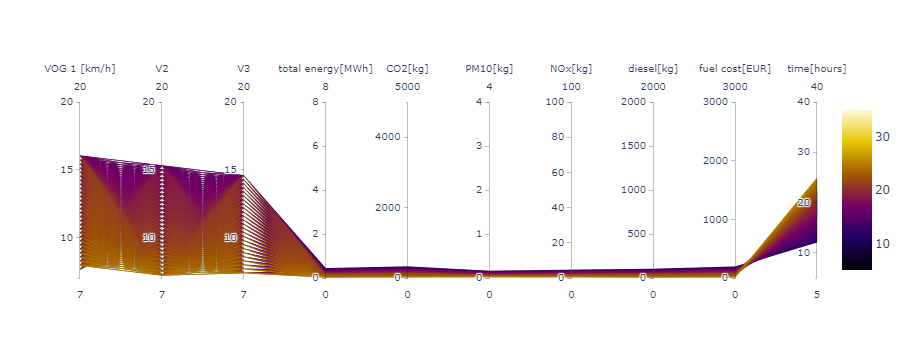

In [30]:

fig = go.Figure(data=
    go.Parcoords(
        line = dict(color = s['total time (hours)'],
                   colorscale = 'Electric',
                   showscale = True,
                   cmin = 5,
                   cmax = 35),
        dimensions = list([
            dict(range = [7,20],
                 # constraintrange = [2,3.5],
                 label = "VOG 1 [km/h]", values = s['s1_v']), 
            dict(range = [7,20],
                 # constraintrange = [2,3.5],
                 label = "V2", values = s['s2_v']),
            dict(range = [7,20],
                 # constraintrange = [2,3.5],
                 label = "V3", values = s['s3_v']), 
            dict(range = [0,8],
                 label = 'total energy[MWh]', values = s['total energy trip (MWh)']),
            dict(range = [0,5000],
                 label = 'CO2[kg]', values = s['total CO2 (kg)']),
            dict(range = [0,4],                
                 label = 'PM10[kg]', values = s['total PM10 (kg)']),
            dict(range = [0,100],                 
                 label = 'NOx[kg]', values = s['total NOx (kg)']),
            dict(range = [0,2000],
                 # constraintrange = [8,20],
                 label = 'diesel[kg]', values = s['total fuel (kg)']),
            dict(range = [0,3000],
                 # constraintrange = [8,20],
                 label = 'fuel cost[EUR]', values = s['total fuel cost (EUR)']),            
            dict(range = [5,40],                 
                 label = 'time[hours]', values = s['total time (hours)']),               
           
        ]),
    )
)
fig.show()

In [31]:
# If you need to save this file as a standalone html file:
fig.write_html("C:/interactiveCharts/LeastEmissionsAward/least_emissions_M1_down.html")